#**Homework 2 - Website Fingerprinting - Data Collection**

## **Objective**
The homework required the implementation of a website fingerprinting approach able to classify the websites visited by a user by observing only the encrypted HTTPS traffic.

More in detail, it was asked to:
1.   **Create a dataset**: this should have been done by visiting 10 times 10
among the most popular news websites that do not require login. For each visit performed, packets exchanged between the requesting machine and the server should have been captured in a separate .pcap file

2.   **Extract Features**: 2 alternative methods were proposed to extract features from each capture collected:
    - (*Mandatory*) Extract biflow statistical feautures (both uplink and dowlink):
      - Number of packets up/down
      - Total bytes up/down
      - Min/max/mean/std of the packet size up/down
      - Min/max/mean/std IAT (Inter Arrival Time) up/down
    - (*Optional*) Extract the Cumulative Trace of packets exchanged, ignoring TCP ACKs, and sample its piecewise linear interpolant at 20 equidistant points. This method is based on an a approach proposed in the literature (Reference: *A. Panchenko et al. “Website Fingerprinting at Internet Scale NDSS 2016*)

3.   **Evaluate the performance of a K-NN approach**: the accuracy obtained by a K-NN classifier with values of K going from 1 to 10 should have been plotted on an Accuracy/K graph

The construction of the **training and test sets** for the predictive algorithm should have been performed in 2 different ways:
1.   At first, the data gathered on a particulare day should have been split in a training set (70%) and a test set (30%)

2.   Then, after some time (e.g. 1 day), an additional test set should have been built, by visiting the same 10 websites 3 times each. Subsequently, the performance obtained using the old training set and the newly created test set should have been compared with the approach using the old training and test sets.

---

This notebook covers the generation of the 2 datasets used for the K-NN algorithm and the feature extraction step, for both statistical biflow feautrues and Cumulative Trace features.

The K-NN implementation and the evaluation of the performances obtained can be found in a separate notebook.

# Install Tools

In [ ]:
!apt-get install tcpdump
!apt-get install dnsutils
!apt-get install tshark

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpcap0.8
Suggested packages:
  apparmor
The following NEW packages will be installed:
  libpcap0.8 tcpdump
0 upgraded, 2 newly installed, 0 to remove and 39 not upgraded.
Need to get 647 kB of archives.
After this operation, 1,773 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libpcap0.8 amd64 1.10.1-4build1 [145 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 tcpdump amd64 4.99.1-3ubuntu0.2 [501 kB]
Fetched 647 kB in 0s (1,799 kB/s)
Selecting previously unselected package libpcap0.8:amd64.
(Reading database ... 121753 files and directories currently installed.)
Preparing to unpack .../libpcap0.8_1.10.1-4build1_amd64.deb ...
Unpacking libpcap0.8:amd64 (1.10.1-4build1) ...
Selecting previously unselected package tcpdump.
Preparing to unpack .../tcpdump_4.99.1-3ubunt

# Import libraries

In [ ]:
import pandas as pd
import numpy as np
import socket
from os import listdir
from os.path import isfile,join
from datetime import datetime
import matplotlib.pyplot as plt

# Path to the Google Drive folder used for the homework
path = "/content/drive/MyDrive/[NM-LAB]/Homework2/"

# Extract Features - Utilities

This section is a collection of utility functions used in the core part of the notebook.

At first we retrieve the list of websites to be visited for the purpose of the homework and we put it into a DataFrame.

In [ ]:
# Read the CSV with all the list of 10 websites to be visited
websites = pd.read_csv(path+"websites.csv",header=None)
websites.columns = ["website"]

# Display the list of websites to be visited
websites

,website
0,https://www.nypost.com
1,https://www.theguardian.com
2,https://www.nytimes.com
3,https://www.washingtonpost.com
4,https://www.cnn.com
5,https://www.cnbc.com
6,https://www.timesofindia.com
7,https://www.express.co.uk
8,https://www.bbc.co.uk
9,https://www.news18.com


We use this function to retrieve the private IP address of the machine were the code is running. The address will be used to understand if a given packet belongs to the uplink or to the downlink.

In [ ]:
def get_private_ip():
    # Createsocket
    s = socket.socket(socket.AF_INET, socket.SOCK_DGRAM)

    try:
        # Connect to a remote server
        s.connect(("8.8.8.8", 80))
        # Get the IP address associated with the socket
        private_ip = s.getsockname()[0]
        # Return the IP address
        return private_ip
    except Exception as e:
        print("Error:", e)
    finally:
        # Close the socket
        s.close()

# Get the private IP address
private_ip_address = get_private_ip()
print("Private IP address:",private_ip_address)

Private IP address: 172.28.0.12


This function is used to extract the biflow statistical features from a DataFrame representing the content of a single capture.


In [ ]:
def extract_features(df,filename):
  # Features dictionary
  features = {}
  df['frame.time'] = pd.to_datetime(df['frame.time'])

  # Build the uplink and downlink DataFrames
  uplink = df[df["ip.src"]==private_ip_address]
  downlink = df[df["ip.src"]!=private_ip_address]

  # Compute the number of packets in uplink and downlink
  features["num_pkts_uplink"] = len(uplink)
  features["num_pkts_downlink"] = len(downlink)

  # Compute the statisitical features concerning the packet size in uplink
  uplink_pkt_size = uplink['ip.len'].astype(float)
  features["total_bytes_uplink"] = uplink_pkt_size.sum()
  features["min_pkt_size_uplink"] = uplink_pkt_size.min()
  features["max_pkt_size_uplink"] = uplink_pkt_size.max()
  features["mean_pkt_size_uplink"] = uplink_pkt_size.mean()
  features["std_pkt_size_uplink"] = uplink_pkt_size.std()

  # Compute the statisitical features concerning the packet size in downlink
  downlink_pkt_size = downlink['ip.len'].astype(float)
  features["total_bytes_downlink"] = downlink_pkt_size.sum()
  features["min_pkt_size_downlink"] = downlink_pkt_size.min()
  features["max_pkt_size_downlink"] = downlink_pkt_size.max()
  features["mean_pkt_size_downlink"] = downlink_pkt_size.mean()
  features["std_pkt_size_downlink"] = downlink_pkt_size.std()

  # Compute the statisitical features concerning the iat in uplink
  iat_uplink = uplink['frame.time'].diff(1).dt.total_seconds().iloc[1:]
  features['min_iat_uplink'] = iat_uplink.min()
  features['max_iat_uplink'] = iat_uplink.max()
  features['mean_iat_uplink'] = iat_uplink.mean()
  features['std_iat_uplink'] = iat_uplink.std()

  # Compute the statisitical features concerning the iat in downlink
  iat_downlink = downlink['frame.time'].diff(1).dt.total_seconds().iloc[1:]
  features['min_iat_downlink'] = iat_downlink.min()
  features['max_iat_downlink'] = iat_downlink.max()
  features['mean_iat_downlink'] = iat_downlink.mean()
  features['std_iat_downlink'] = iat_downlink.std()

  # Retrieve the label associated to the input DataFrame
  url = websites[websites['website'].str.contains(filename, case=False)].values[0][0]
  features['website'] = url.split("://")[1]

  # Return a dictionary with all the extracted features
  return features

This function is used to check that the data inside the input DataFrame, which is supposed to be the content of a single traffic capture, is related to a single (bidirectional) conversation, i.e. the flow of packets going back and forth from the client machine to the server hosting a website.

If the count of unique combinations of source IP address, source port, destination IP address, destination port is equal to 2 it is more likely that we were able to isolate the only conversation of interest for the purpose of the assignment

In [ ]:
def is_single_conversation(capture_df):
  conversations_count = len(capture_df.groupby(["ip.src","ip.dst","tcp.srcport","tcp.dstport"]))
  return  conversations_count == 2

This function is used to check that at least 2 packets with [FIN,ACK] labels were captured as part of a single traffic capture. This is useful to understand if the conversation was intercepted until its end. We also accept the case in which this number is greater than 2, because for instance, in case of retransmissions, we can have more than 2 packets with these same flags.

In [ ]:
def check_fin_acks(capture_df):
  fin_ack_count = len(capture_df[capture_df["tcp.flags"] == "0x0011"])
  return fin_ack_count >= 2

It is to underline the fact that the last two check proposed are neither rigorous nor exhaustive to precisely determine the correctness of the traffic captures performed.

However, they can give some useful insights into the effectiveness of the methodology used for performing captures and they can still be used to assess the quality of the network conditions during capture. Therefore, in case of low performance, captures might be repeated.

# Compute Cumulative Traces - Utilities

This section contains the utility function used to compute the Cumulative Trace of a given traffic capture.

Given a DataFrame representing a single traffic capture, we compute the cumulative trace in the following way:
1.   We remove rows representing TCP ACKs
2.   We arrange packets in ascending order based on capture timestamp
3.   We initialize the list represnting the cumulative trace with a single '0' value
4.   We iterate over the rows of the DataFrame and:
     - for each packet (row) we compute the next element in the cumulative trace by summing or subtracting the packet size, depedning on whether the packet is incoming or outgoing respectively, to the previous element in the cumulative trace list.

We end up having a list representing the cumulative trace of a given conversation, whose length is equal to the number of packets exchanged.

In [ ]:
def compute_trace(df):
  # Cumulative Trace
  trace = [0]
  uplink_pkt_size = df['ip.len'].astype(float)
  df['frame.time'] = pd.to_datetime(df['frame.time'])
  # Sort values in ascending order
  df.sort_values(by="frame.time")

  idx = 0
  for _ , pkt in df.iterrows():
    # Outgoing packet -> subtract
    if pkt["ip.src"] == private_ip_address:
      trace.append(trace[idx-1] - pkt["ip.len"])

    # Incoming packet -> sum
    else:
      trace.append(trace[idx-1] + pkt["ip.len"])
    idx += 1

  #print(trace)
  return trace

# Part 1: Data Collection

This section is dedicated to the collection of data that for the K-NN algorithm will at first split in traing and test set.

In the bginning, we list the network interfaces available on the local machine. This is useful to understand which interface should be specified in the `tcpdump` command to observe the corresponding traffic flow.

In [ ]:
!ip a

1: lo: <LOOPBACK,UP,LOWER_UP> mtu 65536 qdisc noqueue state UNKNOWN group default qlen 1000
    link/loopback 00:00:00:00:00:00 brd 00:00:00:00:00:00
    inet 127.0.0.1/8 scope host lo
       valid_lft forever preferred_lft forever
7: eth0@if8: <BROADCAST,MULTICAST,UP,LOWER_UP> mtu 1500 qdisc noqueue state UP group default 
    link/ether 02:42:ac:1c:00:0c brd ff:ff:ff:ff:ff:ff link-netnsid 0
    inet 172.28.0.12/16 brd 172.28.255.255 scope global eth0
       valid_lft forever preferred_lft forever


Here, we implement a bash scrpit that reads the CSV files with the list of websites to be visited and for each of them:
1.   It starts recording a traffic capture on the ethernet interface
2.   It generates a traffic flow (to be captured) that esentially performs an HTTPS request toward the given website
3.   It produces a .pcap file with the data collected and stores it on the local machine

These 3 steps are repeated 10 times for each of the 10 websites in the CSV. Therefore in the end we end up with a set of 100 .pcap files.

`tcpdump` is the command executed to record the captures. Under normal conditions, the machine interacts with multiple hosts, producing traffics of diverse nature, all flowing through the same interface. In order to filter only the HTTPS traffic produced by the interaction between the local machine and the remote server hosting a specific website, a custom `tcpdump` filter is identified for each websites.

The filter has a fixed part, represented by the `tcp` and `tcp port 443` strings, which filters out only TCP traffic corresponding a HTTPS exchanges.

The variable part of the filter is used to filter the only conversation occurring between the server hosting the website and the local machine. It is determined by resolving a spcefic domain name, thus retrieving the IP address(es) associated to it. Then the fixed part of the filter is put in `and` with the predicate that puts in `or` the list of IP addresses associated with the website host. In this way, even in the case of a host with multiple IPs, we are able to obtain a filter that retrieves the relevant packets, whatever was the IP address used by the local machine to contact the remote host.

In the end, in case of of host with multiple IP adrresses we obtaian a filter of this form:

```
tcp and host (IP_ADDRESS_1 or ... IP_ADDRESS_N) and tcp port 443
```
In the case of a single IP the filter looks like this:

```
tcp and host (IP_ADDRESS) and tcp port 443
```

In [ ]:
%%bash
declare -a websites
num_requests=10

# Path to csv file with the websites list
csv_file="/content/drive/MyDrive/[NM-LAB]/Homework2/websites.csv"

# Read CSV with websites
while IFS=',' read -r website; do
  # Append each line representing a website to the corresponding array
  websites+=("$website")
done < "$csv_file"

for website in "${websites[@]}"; do
  echo "Website: $website"

  # Remove the protocol part
  domain="${website#*://}"
  echo "Domain name: $domain"
  # Remove "www" at the beginning of the string
  filename="${domain#www.}"
  # Keep just the string before the first "." in the domain name
  filename="${filename%%.*}"
  echo "File name: $filename"

  # Solve the domain name and keep only ipv4 addresses
  ip_addresses=$(dig +short ${domain} | grep -E '([0-9]{1,3}\.){3}[0-9]{1,3}')
  echo "$ip_addresses "

  # Build a filter for the `tcpdump` command
  filter="tcp and (host "
  # Boolean to mark the first ip address in the list of ips to be appended to the filter
  first=true

  # Iterate over the list of ips associated to the given domain and build the tcpdump filter
  for ip in $ip_addresses; do
  # If this is the first ip address to append
  if $first; then
    filter="$filter$ip"
    # Update the boolean for next iterations
    first=false
  else
    # In case the ip is not the first, put it in conjuction with the previous ones
    filter="$filter or host $ip"
  fi
  done

  # Append the port filter at the end of the string built so far
  filter="$filter) and tcp port 443"
  echo "Filter: $filter"
  echo

  # Execute the `tcpdump` command `num_requests` times for each website in the CSV.
  # Record a separate capture for each request
  for ((i = 1; i <= $num_requests; i++)); do
    # Make an https request to the website after 5 seconds from the start of the capture
    timeout 9 tcpdump -i eth0 -W 1 "$filter" -w "${filename}_${i}.pcap" & (sleep 5; curl -s ${website} > /dev/null)
    # Wait some time before issuing another request
    sleep 5
  done
done

Website: https://www.nypost.com
Domain name: www.nypost.com
File name: nypost
192.0.66.32 
Filter: tcp and (host 192.0.66.32) and tcp port 443

Website: https://www.theguardian.com
Domain name: www.theguardian.com
File name: theguardian
151.101.1.111
151.101.65.111
151.101.129.111
151.101.193.111 
Filter: tcp and (host 151.101.1.111 or host 151.101.65.111 or host 151.101.129.111 or host 151.101.193.111) and tcp port 443

Website: https://www.nytimes.com
Domain name: www.nytimes.com
File name: nytimes
151.101.1.164
151.101.65.164
151.101.129.164
151.101.193.164 
Filter: tcp and (host 151.101.1.164 or host 151.101.65.164 or host 151.101.129.164 or host 151.101.193.164) and tcp port 443

Website: https://www.washingtonpost.com
Domain name: www.washingtonpost.com
File name: washingtonpost
104.106.175.75 
Filter: tcp and (host 104.106.175.75) and tcp port 443

Website: https://www.cnn.com
Domain name: www.cnn.com
File name: cnn
151.101.3.5
151.101.67.5
151.101.131.5
151.101.195.5 
Filter: t

tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
29 packets captured
29 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
26 packets captured
26 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
29 packets captured
29 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
28 packets captured
28 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
27 packets captured
27 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
27 packets captured
27 packets received by filter
0 packets dropped by kernel
tcpdump: listeni

After having prodcued a .pcap file for each HTTPS request performed to a website, the captures are converted in the CSV format and saved in a specific Google Drive folder.

In [ ]:
# Retrieve the names of the files in the current (local) directory
tcpdumpfiles = [f for f in listdir() if isfile(f)]

# Iterate over the names of the .pcap files
for f in tcpdumpfiles:
  # Extract the filename
  filename = f.split(".")[0]
  # Execute the `tshark` command to save a subset of interest of the fields in the file into a CSV format
  !tshark -r {f} -T fields \
  -e ip.src \
  -e ip.dst \
  -e tcp.srcport \
  -e tcp.dstport \
  -e ip.len \
  -e frame.time \
  -e tcp.flags \
  -E header=y -E separator=, -E quote=d -E occurrence=f > {path}/csv/{filename}.csv

## Extract Features

This section is dedicated to the implementation of the feature extraction step.

### Extract Biflow Statistical Features

To extract biflow statistical features, we iterate over the list of CSV files representing a capture. Then, we turn each CSV file into a DataFrame and, after having performed a quick correctness check over it, we extract features.

In the end we use the extracted features to build a dataset to be used for future classifcation purposes. The dataset has one row for each original traffic capture, thus representing its statistical features.

In [ ]:
# List of file names in the "csv" folder
csvfiles = [f for f in listdir(path+"csv/")]
# Sort file names in alphabetical order for convenience
csvfiles = sorted(csvfiles)
# Initialize an empty dataset
dataset = []
# Define correctness counts
single_conversations = 0
corrcet_fin_ack_counts = 0

# Iterate over the set of CSV file names
for csv in csvfiles:
  filepath = join(path,"csv/", csv)

  try:
    # Transform the CSV file into a DataFrame
    df = pd.read_csv(filepath)
    # Check if it is empty
    if df.empty:
      print(f"The file {filepath} is empty.")
    else:
      # Extract the filename
      filename = csv.split("_")[0]

      # Check if it represents a single conversation
      single_conversation = is_single_conversation(df)
      if single_conversation:
        single_conversations += 1

      # Check the number of packets with [FIN,ACK] flags
      correct_fin_ack_count = check_fin_acks(df)
      if correct_fin_ack_count:
        corrcet_fin_ack_counts += 1

      # Extract Features
      features = extract_features(df, filename)

      # Append features to the dataset
      dataset.append(features)
  except pd.errors.EmptyDataError:
    print(f"The file {filepath} is empty or does not contain any data.")
  except Exception as e:
    print(f"An error occurred while reading the file {filepath}: {e}")

### Compute Cumulative Trace

In order to compute the cumulative trace starting from individual CSV files representing a single traffic capture, we iterate over them turning each CSV in a DataFrames. Then for each DataFrame, after ahving removed the packets with the TCP ACK flag raised, we invoke the `compue_trace` function, which returns the list of values representing the cumulative trace of specific capture. We compute the pair-wise linear interpolant and we finally sample it at 20 equidistant points.

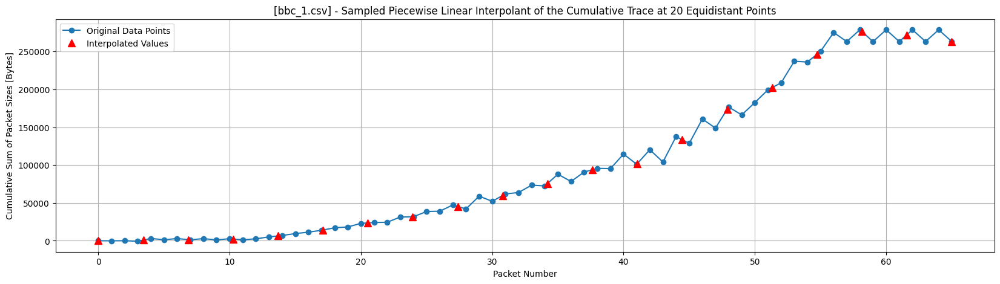

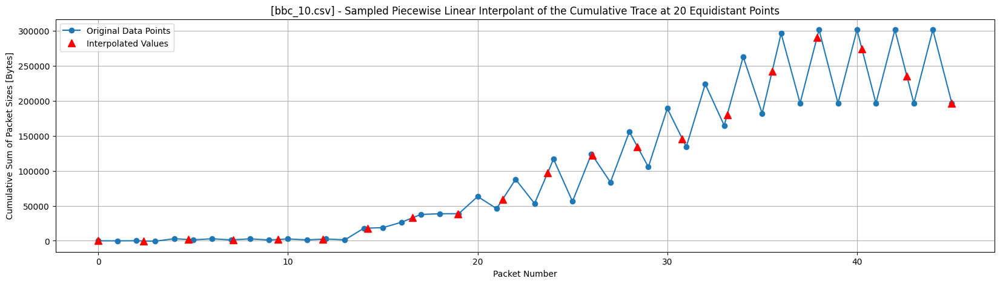

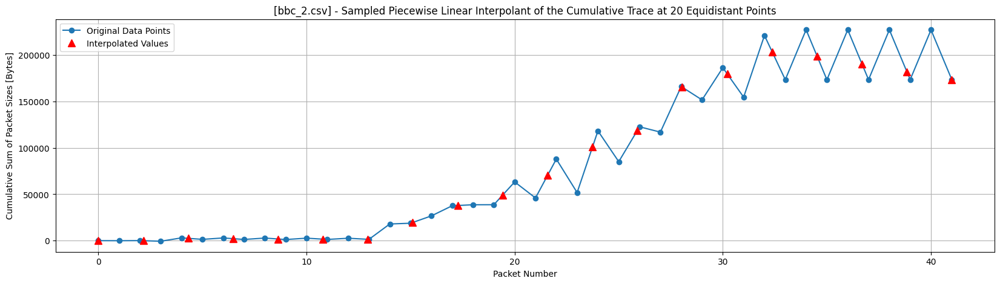

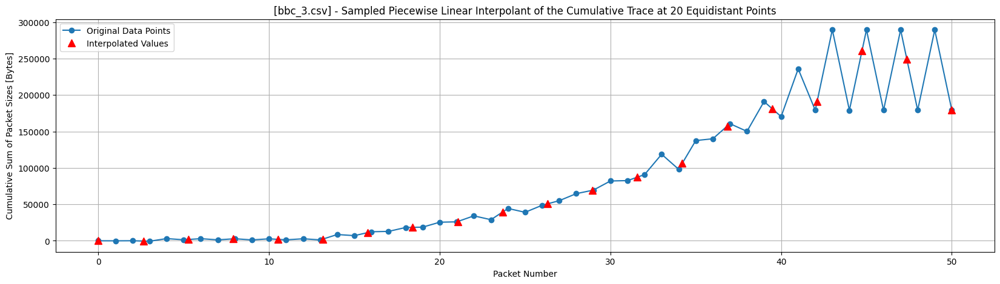

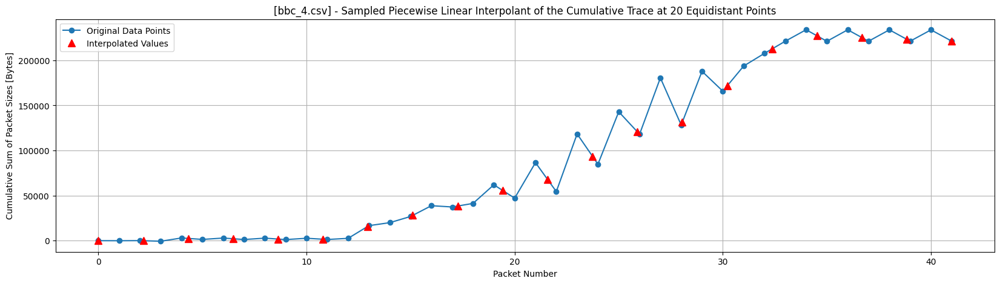

...

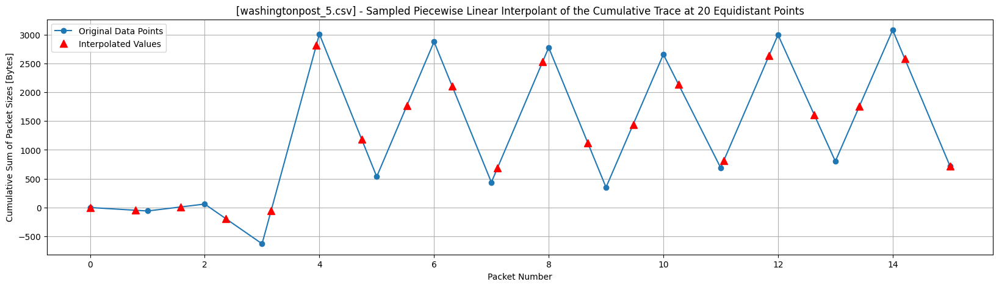

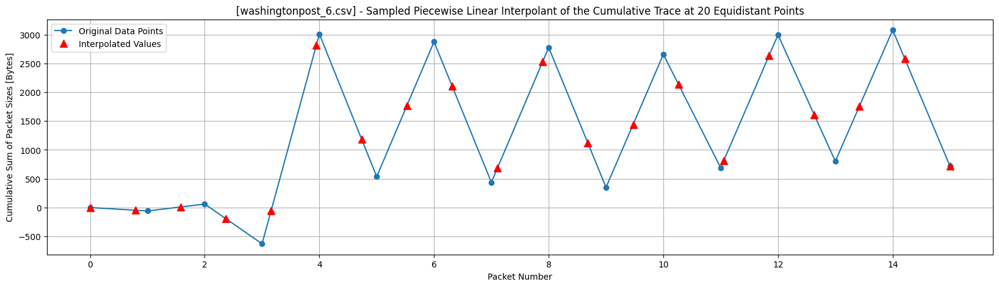

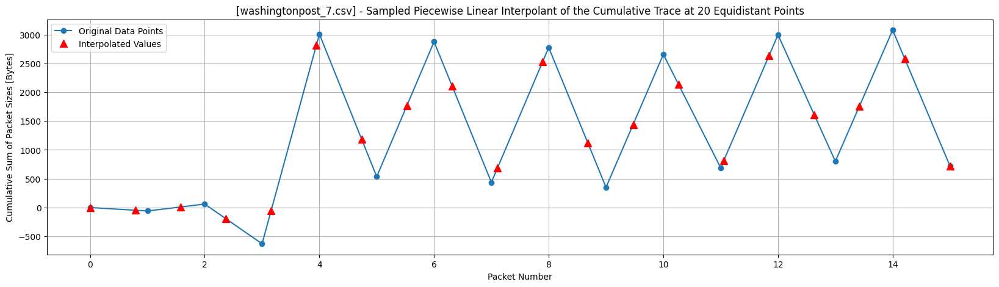

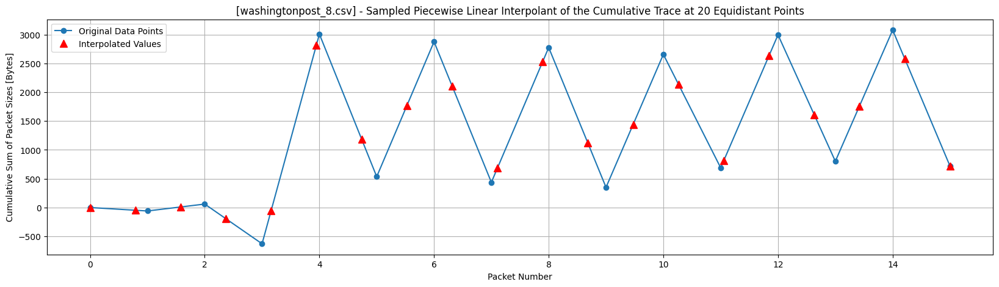

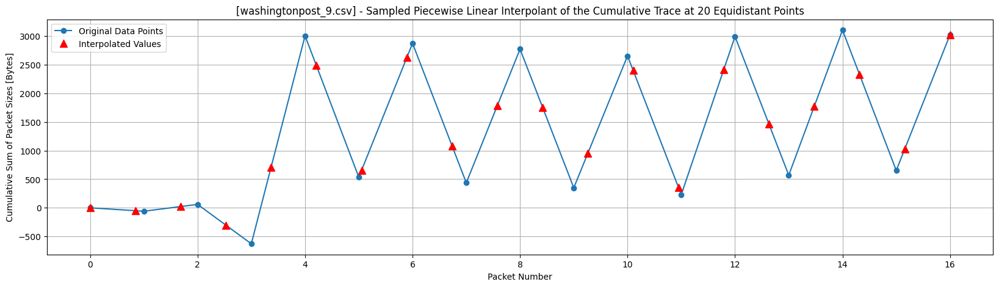

In [ ]:
# Number of equidistant points to use in the pair-wise linear interpolation of the cumulative trace
num_samples = 20
# Initizialize datasets to store the cumulative traces and labels
trace_dataset = []
labels_dataset = []

# Iterate over CSV files inside the "csv" folder
for csv in csvfiles:
  filepath = join(path,"csv/", csv)
  df = pd.read_csv(filepath)
  # Filter out TCP ACKs from the capture
  df = df[df["tcp.flags"] != "0x0010"]
  # Compute the comulative trace of the conversation
  trace = compute_trace(df)
  # Define the length of the trace
  pkt_numbers = np.arange(len(trace))
  # Define the x coordinates of the sampled linear interpolation of the cumulative trace
  x_interp = np.linspace(0,len(trace)-1, num_samples)
  # Define the y coordinates of the sampled linear interpolation of the cumulative trace
  y_interp = np.interp(x_interp, pkt_numbers, trace)
  #print(len(trace))
  #print(len(y_interp))

  # Plot the sampled cumulative trace vs. the original version
  plt.figure(figsize=(20, 5))
  plt.plot(pkt_numbers, trace, 'o-', label='Original Data Points')
  plt.plot(x_interp, y_interp, '^r', label='Interpolated Values',markersize=8)
  plt.xlabel('Packet Number')
  plt.ylabel('Cumulative Sum of Packet Sizes [Bytes]')
  plt.title(f'[{csv}] - Sampled Piecewise Linear Interpolant of the Cumulative Trace at {num_samples} Equidistant Points')
  plt.legend()
  plt.grid(True)
  plt.show()

  # Extract the filename
  filename = csv.split("_")[0]
  # Retrieve the label from the filename
  url = websites[websites['website'].str.contains(filename, case=False)].values[0][0]
  url = url.split("://")[1]

  # Append both data and target to the corresponding data structures
  trace_dataset.append(y_interp)
  labels_dataset.append(url)

From the plots of the pair-wise linear interpolant of the comulative trace, we can notice that graphs related to the same websites exhibit similar patterns. Take for example the first 10 graphs, which concern the traffic captured when visiting the BBC website. These graphs have a shape indicating that packets eaxchanged in the beginning of the conversation are relatively light both in uplink and dowlink. Then, after a certain number of packets the number of bytes in each packet in both direction increases.

We can also notice that starting from the 11th ploy, referred to a different website, the shape of the the cumulative trace changes. This property is interesting, because it suggests that the cumulative trace is a class-discriminative feature and can be used to effectively classify the website visited by a user only by looking at it.

We then build a unique DataFrame, where each row corresponds to a different capture and each column represents one of the 20 samples extracted from the cumulative trace of each capture.

We then drop the first column because, by definition, the cumulative trace starts at 0 bytes (when the number of packtes exchanged is 0) and, given that this is 0 for all the rows in the dataset, it is not a class-discriminative feature. In other words, it will not affect the classifiation process.

In [ ]:
# Build DataFrames starting from data gathered
trace_df = pd.DataFrame(trace_dataset)
labels_df = pd.DataFrame(labels_dataset)

# Concatenate the 2 dataframes
labelled_trace_df = pd.concat([trace_df, labels_df], axis=1)
# Define column names
column_names = ["T" + str(idx) for idx in range(num_samples)] + ["Website"]
labelled_trace_df.columns = column_names

# Drop the firs sample of the cumulative trace for each row in the dataset
labelled_trace_df.drop(columns=["T0"], inplace=True)

## Inspect Data

Let's now inspect the 2 datasets built so far.

### Inspect Biflow Statistical Features

We start by inspecting the dataset with the biflow statistical fatures extracted by each traffic capture.

In [ ]:
df = pd.DataFrame(dataset)
display(df)

,num_pkts_uplink,num_pkts_downlink,total_bytes_uplink,min_pkt_size_uplink,max_pkt_size_uplink,mean_pkt_size_uplink,std_pkt_size_uplink,total_bytes_downlink,min_pkt_size_downlink,max_pkt_size_downlink,...,std_pkt_size_downlink,min_iat_uplink,max_iat_uplink,mean_iat_uplink,std_iat_uplink,min_iat_downlink,max_iat_downlink,mean_iat_downlink,std_iat_downlink,website
0,66,65,4231.0,40.0,569.0,64.106061,64.832121,573013.0,52.0,39040.0,...,9369.559465,0.000006,0.089473,0.002579,0.011001,0.000001,0.091960,0.002573,0.011400,www.bbc.co.uk
1,46,47,3191.0,40.0,569.0,69.369565,77.316481,579635.0,52.0,39040.0,...,12472.990530,0.000006,0.056596,0.002640,0.008413,0.000000,0.058164,0.002539,0.008553,www.bbc.co.uk
2,43,44,3035.0,40.0,569.0,70.581395,79.886000,571631.0,52.0,56368.0,...,15659.430595,0.000004,0.055132,0.002589,0.008472,0.000001,0.056333,0.002485,0.008564,www.bbc.co.uk
3,51,52,3451.0,40.0,569.0,67.666667,73.534119,571910.0,52.0,56368.0,...,13955.549997,0.000006,0.054587,0.002246,0.007668,0.000001,0.057237,0.002140,0.007947,www.bbc.co.uk
4,46,45,3191.0,40.0,569.0,69.369565,77.316481,571522.0,52.0,47704.0,...,13857.039449,0.000006,0.058279,0.003034,0.008924,0.000000,0.059685,0.003061,0.009172,www.bbc.co.uk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,12,9,1457.0,52.0,569.0,121.416667,143.691879,5150.0,52.0,2948.0,...,958.981462,0.000005,0.058028,0.007913,0.017541,0.000001,0.059728,0.016066,0.023273,www.washingtonpost.com
96,12,9,1457.0,52.0,569.0,121.416667,143.691879,5150.0,52.0,2948.0,...,958.981462,0.000007,0.066319,0.008199,0.019619,0.000002,0.068592,0.016289,0.025644,www.washingtonpost.com
97,12,9,1457.0,52.0,569.0,121.416667,143.691879,5150.0,52.0,2948.0,...,958.981462,0.000007,0.054767,0.007398,0.016420,0.000002,0.056310,0.015351,0.022257,www.washingtonpost.com
98,12,9,1457.0,52.0,569.0,121.416667,143.691879,5150.0,52.0,2948.0,...,958.981462,0.000006,0.059687,0.007535,0.017742,0.000001,0.061293,0.015366,0.023457,www.washingtonpost.com


We can see that we correctly have 100 rows, as the number of websites multiplicated by the number of visits performed for each of them.

In [ ]:
print(f"Percentage of captures representing a single conversation: {single_conversations/len(df)*100:.2f}%")

Percentage of captures representing a single conversation: 100.00%


In [ ]:
print(f"Percentage of captures showing at least 2 [FIN,ACK] : {corrcet_fin_ack_counts/len(df)*100:.2f}%")

Percentage of captures showing at least 2 [FIN,ACK] : 89.00%


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   num_pkts_uplink         100 non-null    int64  
 1   num_pkts_downlink       100 non-null    int64  
 2   total_bytes_uplink      100 non-null    float64
 3   min_pkt_size_uplink     100 non-null    float64
 4   max_pkt_size_uplink     100 non-null    float64
 5   mean_pkt_size_uplink    100 non-null    float64
 6   std_pkt_size_uplink     100 non-null    float64
 7   total_bytes_downlink    100 non-null    float64
 8   min_pkt_size_downlink   100 non-null    float64
 9   max_pkt_size_downlink   100 non-null    float64
 10  mean_pkt_size_downlink  100 non-null    float64
 11  std_pkt_size_downlink   100 non-null    float64
 12  min_iat_uplink          100 non-null    float64
 13  max_iat_uplink          100 non-null    float64
 14  mean_iat_uplink         100 non-null    flo

From the summary of the dataset info, we can see that all columns do not contain null values (30 out of 30 calues are not null).

In [ ]:
summary_df = df.groupby('website').size().reset_index(name='count')
display(summary_df)

filtered_summary_df = summary_df[summary_df["count"] < 10]
#print(filtered_summary_df["website"].values)

,website,count
0,www.bbc.co.uk,10
1,www.cnbc.com,10
2,www.cnn.com,10
3,www.express.co.uk,10
4,www.news18.com,10
5,www.nypost.com,10
6,www.nytimes.com,10
7,www.theguardian.com,10
8,www.timesofindia.com,10
9,www.washingtonpost.com,10


By looking at this addtional print, we can inspect the count of rows for each website. In case of empty captures, this could be useful to understand the captured of which website failed. In this case, no empty capture was performed.

### Inspect Cumulative Trace

Let's now inspect the cumulative trace dataset.

In [ ]:
display(labelled_trace_df)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,Website
0,899.000000,1539.157895,2313.947368,6372.578947,14195.473684,23561.000000,31755.263158,45354.157895,59816.000000,75731.000000,93916.842105,102119.736842,133418.000000,173867.526316,202438.421053,246509.000000,276375.157895,272229.157895,263264.0,www.bbc.co.uk
1,-193.842105,1810.000000,1444.473684,1896.315789,2385.052632,18114.947368,32989.105263,38700.105263,59198.052632,96716.947368,121926.894737,134615.157895,145859.421053,180198.526316,242113.421053,290466.052632,273857.315789,235230.263158,196579.0,www.bbc.co.uk
2,-48.789474,2490.000000,2127.526316,1783.210526,1594.736842,1453.947368,19601.105263,37872.368421,49038.157895,70217.842105,100745.526316,118657.210526,165223.842105,179572.368421,203420.894737,198792.789474,190325.105263,181879.526316,173371.0,www.bbc.co.uk
3,-375.157895,1779.473684,2625.526316,1953.157895,2386.473684,11260.105263,18420.105263,26413.473684,39483.157895,50723.578947,69254.736842,87314.210526,106359.052632,157418.210526,181277.263158,190745.263158,260450.526316,248842.631579,179130.0,www.bbc.co.uk
4,-48.789474,2490.000000,2127.526316,1783.210526,1597.105263,15921.210526,28081.894737,38415.526316,55738.842105,67970.157895,93653.473684,120704.789474,131380.631579,171701.526316,212732.578947,227228.842105,225244.473684,223282.210526,221257.0,www.bbc.co.uk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-47.368421,9.473684,-193.842105,-54.736842,2816.578947,1185.789474,1767.105263,2105.789474,683.105263,2528.894737,1115.789474,1442.315789,2138.368421,810.368421,2630.894737,1609.947368,1760.315789,2581.368421,719.0,www.washingtonpost.com
96,-47.368421,9.473684,-193.842105,-54.736842,2816.578947,1185.789474,1767.105263,2105.789474,683.105263,2528.894737,1115.789474,1442.315789,2138.368421,810.368421,2630.894737,1609.947368,1760.315789,2581.368421,719.0,www.washingtonpost.com
97,-47.368421,9.473684,-193.842105,-54.736842,2816.578947,1185.789474,1767.105263,2105.789474,683.105263,2528.894737,1115.789474,1442.315789,2138.368421,810.368421,2630.894737,1609.947368,1760.315789,2581.368421,719.0,www.washingtonpost.com
98,-47.368421,9.473684,-193.842105,-54.736842,2816.578947,1185.789474,1767.105263,2105.789474,683.105263,2528.894737,1115.789474,1442.315789,2138.368421,810.368421,2630.894737,1609.947368,1760.315789,2581.368421,719.0,www.washingtonpost.com


Also in this case the number of rows is corretly equal to 100, as the number of total traffic captures performed.

In [ ]:
labelled_trace_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   T1       100 non-null    float64
 1   T2       100 non-null    float64
 2   T3       100 non-null    float64
 3   T4       100 non-null    float64
 4   T5       100 non-null    float64
 5   T6       100 non-null    float64
 6   T7       100 non-null    float64
 7   T8       100 non-null    float64
 8   T9       100 non-null    float64
 9   T10      100 non-null    float64
 10  T11      100 non-null    float64
 11  T12      100 non-null    float64
 12  T13      100 non-null    float64
 13  T14      100 non-null    float64
 14  T15      100 non-null    float64
 15  T16      100 non-null    float64
 16  T17      100 non-null    float64
 17  T18      100 non-null    float64
 18  T19      100 non-null    float64
 19  Website  100 non-null    object 
dtypes: float64(19), object(1)
memory usage: 15.8+ KB


Also in this case all columns do not contain null values.

## Save Data

We finally save the 2 datasets, including in the name the date on which the they were generated.

### Save Biflow Statistifcal Features Dataset

In [ ]:
# Get the current date
date = datetime.now().strftime("%Y-%m-%d")
df.to_csv(path+"dataset_"+date+".csv")

### Save Cumulative Traces Dataset

In [ ]:
labelled_trace_df.to_csv(path+"trace_dataset_"+date+".csv")

# Part 2: Test Data Collection

This sections concerns the collection of data to be used as an external test set in the K-NN classfication algorithm. The structure is analogous to the one seen for the first dataset. The main difference is in the number of samples gathered for each website, which in this case is 3.

This part of the notebook was run after 1 day with respect to the execution of the first part. Of course the code used in first instance could have been modified to repeat the process with a different combination of parameters, however, in order to make the notebook more readable, without having to run it again to see the print outputs, it was decided to add a separate section for the second data collection process.

*Note: in order to execute the second part of the notebook after some time from the run of the first portion, you would need to re-run the utility sections at the beginning of the notebook itself.*

Here, like in the case of the first data colllection process, we implement a bash scrpit that reads the CSV files with the list of websites to be visited and for each of them:
1.   It starts recording a traffic capture on the ethernet interface
2.   It generates a traffic flow (to be captured) that esentially performs an HTTPS request toward the given website
3.   It produces a .pcap file with the data collected and stores it on the local machine

These 3 steps are repeated **3** times for each of the 10 websites in the CSV. Therefore in the end we end up with a set of *30* .pcap files.

The `tcdump` filter is designed following the same processes seen in the first part of the notebook.

In [ ]:
%%bash
declare -a websites
num_requests=3
# Path to csv file with the websites list
csv_file="/content/drive/MyDrive/[NM-LAB]/Homework2/websites.csv"

# Read CSV with websites
while IFS=',' read -r website; do
  # Append each line representing a website to the corresponding array
  websites+=("$website")
done < "$csv_file"

for website in "${websites[@]}"; do
  echo "Website: $website"

  # Remove the protocol part
  domain="${website#*://}"
  echo "Domain name: $domain"
  # Remove "www" at the beginning of the string
  filename="${domain#www.}"
  # Keep just the string before the first "." in the domain name
  filename="${filename%%.*}"
  echo "File name: $filename"

  # Solve the domain name and keep only ipv4 addresses
  ip_addresses=$(dig +short ${domain} | grep -E '([0-9]{1,3}\.){3}[0-9]{1,3}')
  echo "$ip_addresses "

  # Build a filter for the `tcpdump` command
  filter="tcp and (host "
  # Boolean to mark the first ip address in the list of ips to be appended to the filter
  first=true

  # Iterate over the list of ips associated to the given domain and build the tcpdump filter
  for ip in $ip_addresses; do
  # If this is the first ip address to append
  if $first; then
    filter="$filter$ip"
    # Update the boolean for next iterations
    first=false
  else
    # In case the ip is not the first, put it in conjuction with the previous ones
    filter="$filter or host $ip"
  fi
  done

  # Append the port filter at the end of the string built so far
  filter="$filter) and tcp port 443"
  echo "Filter: $filter"
  echo

  date=$(date +"%Y_%m_%d")
  # Execute the `tcpdump` command `num_requests` times for each website in the CSV.
  # Record a separate capture for each request
  for ((i = 1; i <= $num_requests; i++)); do
    # Make an https request to the website after 5 seconds from the start of the capture
    timeout 10 tcpdump -i eth0 -W 1 "$filter" -w "/content/captures/${filename}_${i}_${date}.pcap" & (sleep 5; curl -s ${website} > /dev/null)
    # Wait some time before issuing another request
    sleep 8
  done
done

Website: https://www.nypost.com
Domain name: www.nypost.com
File name: nypost
192.0.66.32 
Filter: tcp and (host 192.0.66.32) and tcp port 443

Website: https://www.theguardian.com
Domain name: www.theguardian.com
File name: theguardian
151.101.1.111
151.101.65.111
151.101.129.111
151.101.193.111 
Filter: tcp and (host 151.101.1.111 or host 151.101.65.111 or host 151.101.129.111 or host 151.101.193.111) and tcp port 443

Website: https://www.nytimes.com
Domain name: www.nytimes.com
File name: nytimes
151.101.1.164
151.101.65.164
151.101.129.164
151.101.193.164 
Filter: tcp and (host 151.101.1.164 or host 151.101.65.164 or host 151.101.129.164 or host 151.101.193.164) and tcp port 443

Website: https://www.washingtonpost.com
Domain name: www.washingtonpost.com
File name: washingtonpost
23.61.98.92 
Filter: tcp and (host 23.61.98.92) and tcp port 443

Website: https://www.cnn.com
Domain name: www.cnn.com
File name: cnn
151.101.3.5
151.101.67.5
151.101.131.5
151.101.195.5 
Filter: tcp and

tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
29 packets captured
29 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
28 packets captured
28 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
28 packets captured
28 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
32 packets captured
32 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
33 packets captured
33 packets received by filter
0 packets dropped by kernel
tcpdump: listening on eth0, link-type EN10MB (Ethernet), snapshot length 262144 bytes
33 packets captured
33 packets received by filter
0 packets dropped by kernel
tcpdump: listeni

After having prodcued a .pcap file for each HTTPS request performed to a website, the captures are converted in the CSV format and saved in a specific Google Drive folder.

In [ ]:
# Retrieve the names of the files in the current (local) directory
tcpdumpfiles = [f for f in listdir("/content/captures/")]

# Iterate over the names of the .pcap files
for f in tcpdumpfiles:
  # Extract the filename
  filename = f.split(".")[0]
  # Execute the `tshark` command to save a subset of interest of the fields in the file into a CSV format
  !tshark -r /content/captures/{f} -T fields \
  -e ip.src \
  -e ip.dst \
  -e tcp.srcport \
  -e tcp.dstport \
  -e ip.len \
  -e frame.time \
  -e tcp.flags \
  -E header=y -E separator=, -E quote=d -E occurrence=f > {path}csv_test/{filename}.csv

## Test Data - Extract Features

This is section is dedicated to the implementation of the feature extraction step.

### Test Data - Extract Biflow Statistical Features

To extract biflow statistical features, we iterate over the list of CSV files representing a capture. Then, we turn each CSV file into a DataFrame and, after having performed a quick correctness check over it, we extract its features.

In the end we use the extracted features to build a test set to be used for future classifcation purposes. The dataset has one row for each original traffic capture, thus representing its statistical features.

In [ ]:
# List of file names in the "csv_test" folder
csvfiles = [f for f in listdir(path+"csv_test/")]
# Sort file names in alphabetical order for convenience
csvfiles = sorted(csvfiles)
# Initialize an empty dataset
dataset_test = []
# Define correctness counts
single_conversations_test = 0
corrcet_fin_ack_counts_test = 0

# Iterate over the set of CSV file names
for csv in csvfiles:
  filepath = join(path,"csv_test/", csv)

  try:
    # Transform the CSV file into a DataFrame
    df = pd.read_csv(filepath)
    # Check if it is empty
    if df.empty:
      print(f"The file {filepath} is empty.")
    else:
      # Extract the filename
      filename = csv.split("_")[0]

      # Check if it represents a single conversation
      single_conversation = is_single_conversation(df)
      if single_conversation:
        single_conversations_test += 1

      # Check the number of packets with [FIN,ACK] flags
      correct_fin_ack_count = check_fin_acks(df)
      if correct_fin_ack_count:
        corrcet_fin_ack_counts_test += 1

      # Extract Features
      features = extract_features(df, filename)

        # Append features to the dataset
      dataset_test.append(features)
  except pd.errors.EmptyDataError:
    print(f"The file {filepath} is empty or does not contain any data.")
  except Exception as e:
    print(f"An error occurred while reading the file {filepath}: {e}")

### Test Data - Compute Cumulative Trace

In order to compute the cumulative trace starting from individual CSV files representing a single traffic capture, we iterate over them turning each CSV in a DataFrames. Then for each DataFrame, after ahving removed the packets with the TCP ACK flag raised, we invoke the `compue_trace` function, which returns the list of values representing the cumulative trace of specific capture. We compute the pair-wise linear interpolant and we finally sample it at 20 equidistant points.

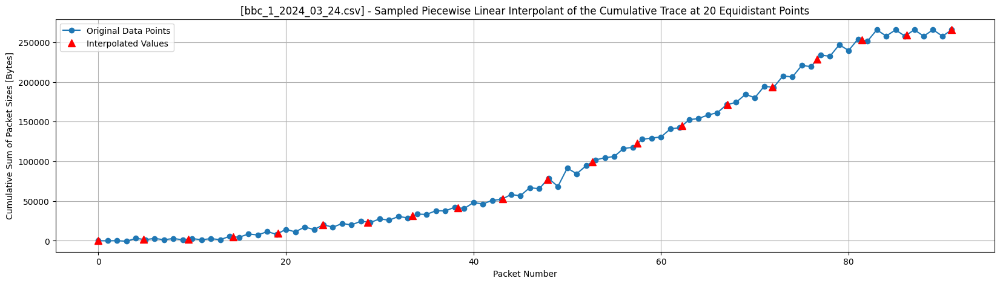

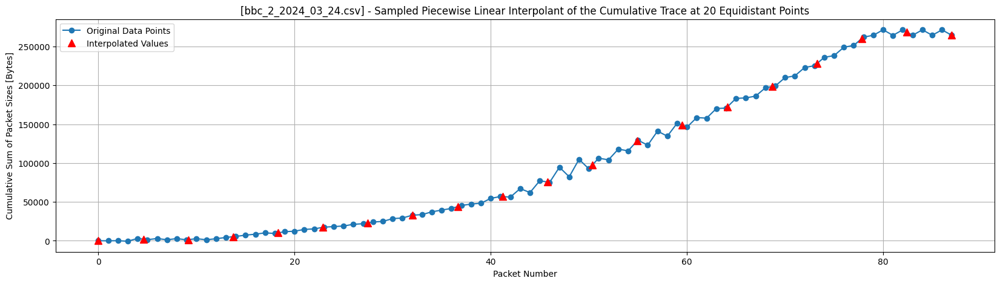

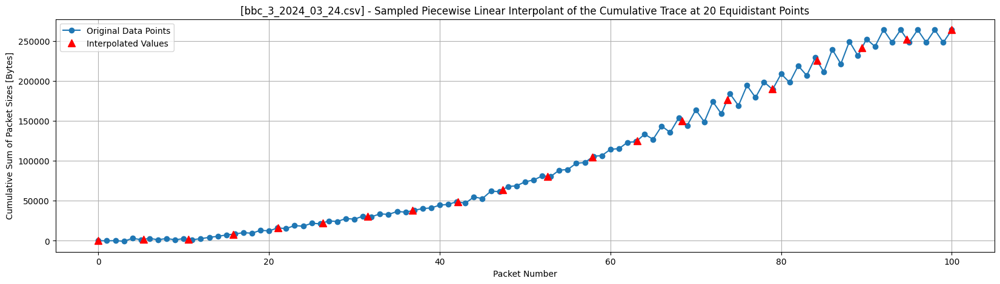

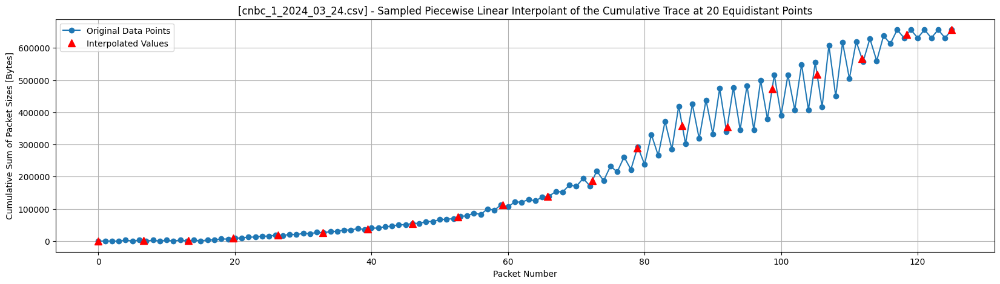

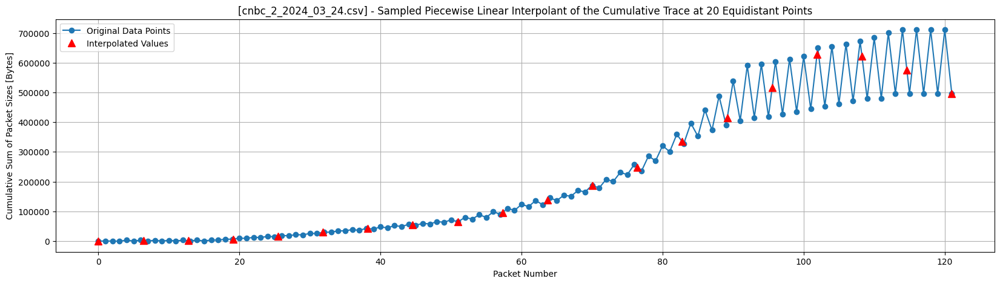

...

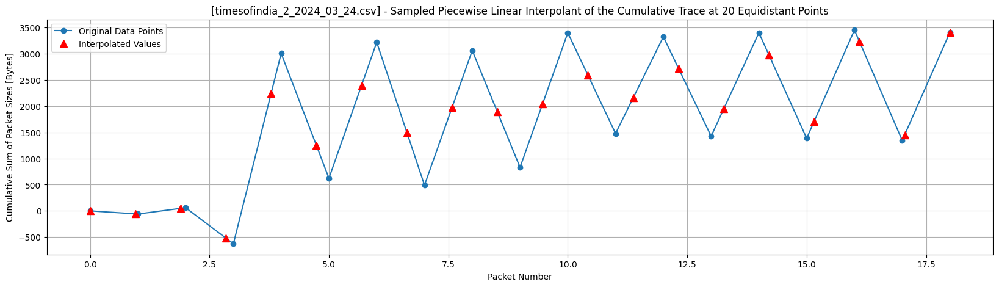

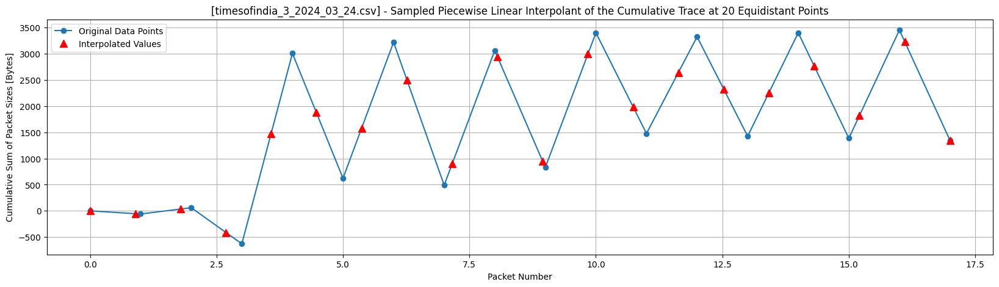

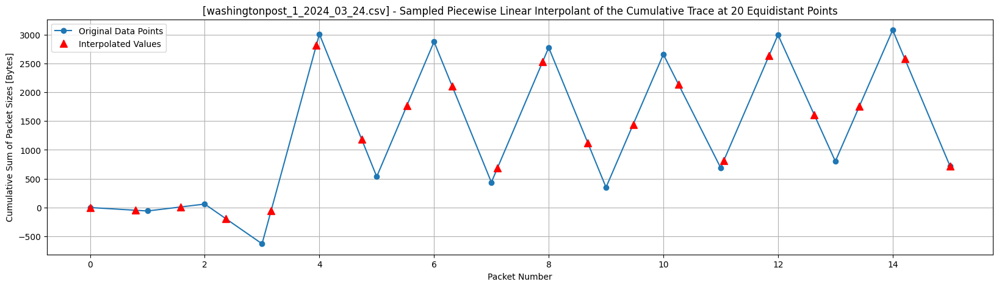

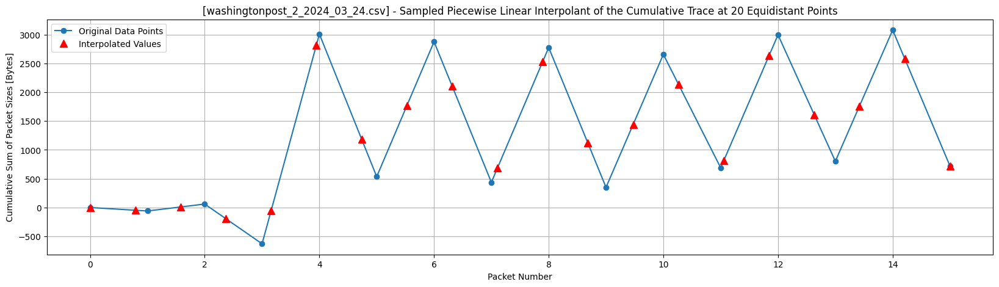

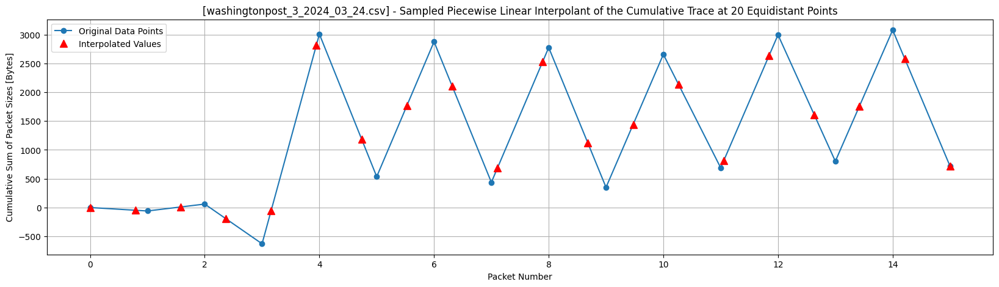

In [ ]:
# Number of equidistant points to use in the pair-wise linear interpolation of the cumulative trace
num_samples =
# Initizialize datasets to store the cumulative traces and labels
trace_dataset_test = []
labels_dataset_test = []

# Iterate over CSV files inside the "csv_test" folder
for csv in csvfiles:
  filepath = join(path,"csv_test/", csv)
  df = pd.read_csv(filepath)
  # Filter out tcp ACKs from the capture
  df = df[df["tcp.flags"] != "0x0010"]
  # Compute the comulative trace of the conversation
  trace = compute_trace(df)
  # Define the length of the trace
  pkt_numbers = np.arange(len(trace))
  # Define the x coordinates of the sampled linear interpolation of the cumulative trace
  x_interp = np.linspace(0, len(trace)-1, num_samples)
  # Define the y coordinates of the sampled linear interpolation of the cumulative trace
  y_interp = np.interp(x_interp, pkt_numbers, trace)
  #print(len(trace))
  #print(len(y_interp))

  # Plot the sampled cumulative trace vs. the original version
  plt.figure(figsize=(20, 5))
  plt.plot(pkt_numbers, trace, 'o-', label='Original Data Points')
  plt.plot(x_interp, y_interp, '^r', label='Interpolated Values',markersize=8)
  plt.xlabel('Packet Number')
  plt.ylabel('Cumulative Sum of Packet Sizes [Bytes]')
  plt.title(f'[{csv}] - Sampled Piecewise Linear Interpolant of the Cumulative Trace at {num_samples} Equidistant Points')
  plt.legend()
  plt.grid(True)
  plt.show()

  # Extract the filename
  filename = csv.split("_")[0]
  # Retrieve the label starting from the filename
  url = websites[websites['website'].str.contains(filename, case=False)].values[0][0]
  url = url.split("://")[1]

  # Append both data and target to the corresponding data structures
  trace_dataset_test.append(y_interp)
  labels_dataset_test.append(url)

Also in this case, from the plots of the pair-wise linear interpolant of the comulative trace, we can notice that graphs related to the same websites exhibit similar patterns.

Indeed, we can notice a change in pattern every 3 plots, i.e. every time we look at the graphs related to a new website. This is consistent to what we had seen in the first part of the notebook.

We then build a unique DataFrame, where each row corresponds to a different capture and each column represents one of the 20 samples extracted from the cumulative trace of each capture.

We then drop the first column because, by definition, the cumulative trace starts at 0 bytes (when the number of packtes exchanged is 0) and, given that this is 0 for all the rows in the dataset, it is not a class-discriminative feature. In other words, it will not affect the classifiation process.

In [ ]:
# Build DataFrames starting from data gathered
trace_df = pd.DataFrame(trace_dataset_test)
labels_df = pd.DataFrame(labels_dataset_test)

# Concatenate the 2 dataframes
labelled_trace_df = pd.concat([trace_df, labels_df], axis=1)
# Define column names
column_names = ["T" + str(idx) for idx in range(num_samples)] + ["Website"]
labelled_trace_df.columns = column_names

# Drop the firs sample of the cumulative trace for each row in the dataset
labelled_trace_df.drop(columns=["T0"], inplace=True) # First column is not really discriminative

## Test Data - Inspection

Let's now inspect the 2 test datasets built so far.

### Test Data - Inspect Biflow Statistical Features

We start by inspecting the test set with the biflow statistical fatures extracted by each traffic capture.

In [ ]:
df = pd.DataFrame(dataset_test)
display(df)

,num_pkts_uplink,num_pkts_downlink,total_bytes_uplink,min_pkt_size_uplink,max_pkt_size_uplink,mean_pkt_size_uplink,std_pkt_size_uplink,total_bytes_downlink,min_pkt_size_downlink,max_pkt_size_downlink,...,std_pkt_size_downlink,min_iat_uplink,max_iat_uplink,mean_iat_uplink,std_iat_uplink,min_iat_downlink,max_iat_downlink,mean_iat_downlink,std_iat_downlink,website
0,93,95,5635.0,40.0,569.0,60.591398,54.773890,557316.0,52.0,17380.0,...,4729.443591,0.000007,0.057974,0.002120,0.006467,0.000001,0.069372,0.001949,0.007332,www.bbc.co.uk
1,90,90,5479.0,40.0,569.0,60.877778,55.666307,557031.0,52.0,17380.0,...,4931.161711,0.000007,0.056996,0.001990,0.006308,0.000000,0.067871,0.001862,0.007299,www.bbc.co.uk
2,107,110,6363.0,40.0,569.0,59.467290,51.111664,558073.0,52.0,11604.0,...,3572.771445,0.000004,0.066857,0.001945,0.006753,0.000000,0.077736,0.001786,0.007527,www.bbc.co.uk
3,144,154,8302.0,40.0,569.0,57.652778,44.286309,2077535.0,52.0,56524.0,...,16000.939031,0.000004,0.060000,0.001359,0.005272,0.000001,0.070721,0.001197,0.005886,www.cnbc.com
4,141,141,8146.0,40.0,569.0,57.773050,44.750478,2076858.0,52.0,56524.0,...,17580.781443,0.000003,0.056624,0.001432,0.005069,0.000001,0.067403,0.001351,0.005834,www.cnbc.com
5,134,135,7782.0,40.0,569.0,58.074627,45.892917,2076546.0,52.0,56524.0,...,17751.419511,0.000005,0.054687,0.001414,0.005070,0.000001,0.065539,0.001320,0.005840,www.cnbc.com
6,326,327,17750.0,40.0,569.0,54.447853,29.394223,2647871.0,52.0,18824.0,...,4838.180029,0.000006,0.055341,0.001241,0.003299,0.000001,0.066204,0.001202,0.003762,www.cnn.com
7,324,333,17646.0,40.0,569.0,54.462963,29.484453,2648189.0,52.0,18824.0,...,4881.104849,0.000006,0.056676,0.001184,0.003366,0.000001,0.067693,0.001117,0.003814,www.cnn.com
8,308,309,16814.0,40.0,569.0,54.590909,30.237521,2646942.0,52.0,18824.0,...,4803.758324,0.000007,0.054609,0.001308,0.003382,0.000001,0.065347,0.001267,0.003822,www.cnn.com
9,54,53,3646.0,52.0,569.0,67.518519,71.350779,449791.0,52.0,24328.0,...,7271.496508,0.000012,0.402863,0.011168,0.055706,0.000001,0.350428,0.011170,0.049689,www.express.co.uk


We can see that we correctly have 30 rows, as the number of websites multiplicated by the number of visits performed for each of them.

In [ ]:
print(f"Percentage of captures representing a single conversation: {single_conversations_test/len(df)*100:.2f}%")

Percentage of captures representing a single conversation: 100.00%


In [ ]:
print(f"Percentage of captures showing at least 2 [FIN,ACK] : {corrcet_fin_ack_counts_test/len(df)*100:.2f}%")

Percentage of captures showing at least 2 [FIN,ACK] : 90.00%


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   num_pkts_uplink         30 non-null     int64  
 1   num_pkts_downlink       30 non-null     int64  
 2   total_bytes_uplink      30 non-null     float64
 3   min_pkt_size_uplink     30 non-null     float64
 4   max_pkt_size_uplink     30 non-null     float64
 5   mean_pkt_size_uplink    30 non-null     float64
 6   std_pkt_size_uplink     30 non-null     float64
 7   total_bytes_downlink    30 non-null     float64
 8   min_pkt_size_downlink   30 non-null     float64
 9   max_pkt_size_downlink   30 non-null     float64
 10  mean_pkt_size_downlink  30 non-null     float64
 11  std_pkt_size_downlink   30 non-null     float64
 12  min_iat_uplink          30 non-null     float64
 13  max_iat_uplink          30 non-null     float64
 14  mean_iat_uplink         30 non-null     floa

From the summary of the dataset info, we can see that all columns do not contain null values (30 out of 30 values are not null).

In [ ]:
summary_df = df.groupby('website').size().reset_index(name='count')
display(summary_df)

filtered_summary_df = summary_df[summary_df["count"] < 3]
print(filtered_summary_df["website"].values)

,website,count
0,www.bbc.co.uk,3
1,www.cnbc.com,3
2,www.cnn.com,3
3,www.express.co.uk,3
4,www.news18.com,3
5,www.nypost.com,3
6,www.nytimes.com,3
7,www.theguardian.com,3
8,www.timesofindia.com,3
9,www.washingtonpost.com,3


[]


By looking at this addtional print, we can inspect the count of rows for each website. In case of empty captures, this could be useful to understand the captured of which website failed. In this case, no empty capture was performed.

### Test Data - Inspect Cumulative Traces

Let's now inspect the cumulative trace dataset.

In [ ]:
display(labelled_trace_df)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,T19,Website
0,1725.000000,2051.052632,5086.368421,9157.105263,19902.631579,23352.157895,31247.684211,41689.210526,52758.210526,77063.315789,99374.631579,122452.578947,144999.473684,171489.842105,193357.473684,228361.736842,2.528067e+05,2.593223e+05,265624.0,www.bbc.co.uk
1,2065.000000,1432.105263,5192.789474,10092.157895,17275.947368,22958.894737,32891.526316,43951.315789,56809.842105,75552.157895,97606.684211,128806.473684,148619.105263,172162.052632,198497.842105,228146.052632,2.604924e+05,2.685723e+05,264461.0,www.bbc.co.uk
2,1779.473684,1954.736842,8198.368421,15971.473684,22305.578947,30276.210526,37732.210526,48772.526316,63834.315789,80615.157895,104891.052632,125436.421053,149718.105263,176145.157895,189844.736842,225357.052632,2.413953e+05,2.522992e+05,264016.0,www.bbc.co.uk
3,1190.105263,737.947368,8538.421053,17696.789474,25656.736842,37907.736842,54894.842105,74057.736842,111555.368421,138765.736842,188457.052632,289393.842105,357594.421053,354374.684211,472629.684211,518320.052632,5.667675e+05,6.418335e+05,656493.0,www.cnbc.com
4,1803.157895,1032.421053,6495.473684,16576.631579,29325.157895,42576.000000,54546.000000,65220.421053,96213.578947,137845.894737,186977.157895,248636.421053,334302.000000,413627.368421,515694.631579,628507.578947,6.212881e+05,5.748659e+05,495697.0,www.cnbc.com
5,2569.473684,2439.263158,6422.526316,15223.368421,25548.421053,41741.684211,57858.736842,77252.842105,110822.105263,145510.210526,194971.578947,234269.578947,343505.684211,401122.473684,454385.526316,469728.368421,4.892628e+05,5.171342e+05,507635.0,www.cnbc.com
6,7410.578947,28280.315789,52751.473684,92282.631579,142501.789474,200852.947368,255100.105263,302331.263158,367082.421053,435177.578947,503728.736842,588883.894737,665627.052632,752402.210526,843889.368421,948704.526316,1.077524e+06,1.220175e+06,1309506.0,www.cnn.com
7,5645.000000,27604.000000,56965.000000,96252.000000,150161.000000,190892.000000,266461.000000,320188.000000,379873.000000,455260.000000,516389.000000,620656.000000,664457.000000,794716.000000,828409.000000,983216.000000,1.042901e+06,1.206372e+06,1192217.0,www.cnn.com
8,6679.052632,27156.947368,53415.894737,96512.526316,144901.368421,196474.842105,248504.315789,315983.052632,387351.684211,458360.736842,516470.210526,590097.578947,683202.210526,791278.842105,891140.105263,982233.578947,1.088949e+06,1.236545e+06,1339866.0,www.cnn.com
9,-629.000000,4280.000000,504.000000,4177.000000,9365.000000,21334.000000,34495.000000,35770.000000,60355.000000,59542.000000,86743.000000,89818.000000,118315.000000,124723.000000,129710.000000,175299.000000,2.026940e+05,2.211750e+05,226998.0,www.express.co.uk


Also in this case the number of rows is corretly equal to 30, as the number of total traffic captures performed.

In [ ]:
labelled_trace_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   T1       30 non-null     float64
 1   T2       30 non-null     float64
 2   T3       30 non-null     float64
 3   T4       30 non-null     float64
 4   T5       30 non-null     float64
 5   T6       30 non-null     float64
 6   T7       30 non-null     float64
 7   T8       30 non-null     float64
 8   T9       30 non-null     float64
 9   T10      30 non-null     float64
 10  T11      30 non-null     float64
 11  T12      30 non-null     float64
 12  T13      30 non-null     float64
 13  T14      30 non-null     float64
 14  T15      30 non-null     float64
 15  T16      30 non-null     float64
 16  T17      30 non-null     float64
 17  T18      30 non-null     float64
 18  T19      30 non-null     float64
 19  Website  30 non-null     object 
dtypes: float64(19), object(1)
memory usage: 4.8+ KB


Also in this case all columns do not contain null values.

## Test Data - Save

We finally save the 2 test datasets, including in the name the date on which the they were generated.

### Test Data - Save Biflow Statistical Features Dataset

In [ ]:
# Get the current date
date = datetime.now().strftime("%Y-%m-%d")
df.to_csv(path+"testset_"+date+".csv")

### Test Data - Save Cumulative Trace Dataset

In [ ]:
labelled_trace_df.to_csv(path+"trace_testset_"+date+".csv")